In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler  
from sklearn.preprocessing import StandardScaler
from statsmodels.graphics.gofplots import qqplot

In [2]:
df= pd.read_excel("F:\\ExcelR\\P_31\\Incidents_service.xlsx")

In [3]:
df.head()

,ID,ID_status,active,count_reassign,count_opening,count_updated,ID_caller,opened_by,opened_time,Created_by,...,category_ID,user_symptom,impact,Support_group,support_incharge,Doc_knowledge,confirmation_check,notify,problem_id,change request
0,INC0000045,New,True,0,0,0,Caller 2403,Opened by 8,2016-02-29 01:16:00,Created by 6,...,Category 55,Symptom 72,2 - Medium,Group 56,Resolver 17,True,False,Do Not Notify,?,?
1,INC0000045,Resolved,True,0,0,3,Caller 2403,Opened by 8,2016-02-29 01:16:00,Created by 6,...,Category 55,Symptom 72,2 - Medium,Group 56,Resolver 17,True,False,Do Not Notify,?,?
2,INC0000045,Closed,False,0,0,4,Caller 2403,Opened by 8,2016-02-29 01:16:00,Created by 6,...,Category 55,Symptom 72,2 - Medium,Group 56,Resolver 17,True,False,Do Not Notify,?,?
3,INC0000047,Active,True,1,0,1,Caller 2403,Opened by 397,2016-02-29 04:40:00,Created by 171,...,Category 40,Symptom 471,2 - Medium,Group 24,Resolver 31,True,False,Do Not Notify,?,?
4,INC0000047,Active,True,1,0,2,Caller 2403,Opened by 397,2016-02-29 04:40:00,Created by 171,...,Category 40,Symptom 471,2 - Medium,Group 24,Resolver 31,True,False,Do Not Notify,?,?


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 141712 entries, 0 to 141711
Data columns (total 25 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   ID                  141712 non-null  object        
 1   ID_status           141712 non-null  object        
 2   active              141712 non-null  bool          
 3   count_reassign      141712 non-null  int64         
 4   count_opening       141712 non-null  int64         
 5   count_updated       141712 non-null  int64         
 6   ID_caller           141712 non-null  object        
 7   opened_by           141712 non-null  object        
 8   opened_time         141712 non-null  datetime64[ns]
 9   Created_by          141712 non-null  object        
 10  created_at          141712 non-null  datetime64[ns]
 11  updated_by          141712 non-null  object        
 12  updated_at          141712 non-null  datetime64[ns]
 13  type_contact        141712 no

In [13]:
df.describe() # 3 numerical variables

,count_reassign,count_opening,count_updated
count,141712.000000,141712.000000,141712.000000
mean,1.104197,0.021918,5.080946
std,1.734673,0.207302,7.680652
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,1.000000
50%,1.000000,0.000000,3.000000
75%,1.000000,0.000000,6.000000
max,27.000000,8.000000,129.000000


In [14]:
df.columns

Index(['ID', 'ID_status', 'active', 'count_reassign', 'count_opening',
       'count_updated', 'ID_caller', 'opened_by', 'opened_time', 'Created_by',
       'created_at', 'updated_by', 'updated_at', 'type_contact', 'location',
       'category_ID', 'user_symptom', 'impact', 'Support_group',
       'support_incharge', 'Doc_knowledge', 'confirmation_check', 'notify',
       'problem_id', 'change request'],
      dtype='object')

In [16]:
df.shape

(141712, 25)

In [17]:
# study numerical data distribution pattern in the dataset
df.skew() 

active                -1.698757
count_reassign         3.111724
count_opening         15.563604
count_updated          4.742897
Doc_knowledge          1.674933
confirmation_check     0.930312
dtype: float64

In [18]:
df.kurtosis()

active                  0.885787
count_reassign         16.523539
count_opening         344.307029
count_updated          35.407081
Doc_knowledge           0.805413
confirmation_check     -1.134535
dtype: float64

In [19]:
# understanding the different attributes
df['ID'].value_counts() 

INC0019396    58
INC0044260    56
INC0005927    46
INC0020718    45
INC0011206    44
              ..
INC0013635     2
INC0002994     2
INC0006839     2
INC0010457     2
INC0002578     2
Name: ID, Length: 24918, dtype: int64

In [20]:
df['ID_status'].value_counts() 

Active                38716
New                   36407
Resolved              25751
Closed                24985
Awaiting User Info    14642
Awaiting Vendor         707
Awaiting Problem        461
Awaiting Evidence        38
-100                      5
Name: ID_status, dtype: int64

In [21]:
df["impact"].value_counts()

2 - Medium    134335
3 - Low         3886
1 - High        3491
Name: impact, dtype: int64

In [24]:
df['active'].value_counts()

True     116726
False     24986
Name: active, dtype: int64

In [25]:
df["location"].value_counts()

Location 204    31766
Location 161    22605
Location 143    19245
Location 108    12623
Location 93     11554
                ...  
Location 137        3
Location 181        3
Location 132        2
Location 31         2
Location 166        2
Name: location, Length: 224, dtype: int64

In [26]:
df['ID_caller'].value_counts() 

Caller 1904    1454
Caller 290      791
Caller 4514     716
Caller 1441     322
Caller 298      293
               ... 
Caller 664        2
Caller 4800       2
Caller 5292       2
Caller 5404       2
Caller 3104       2
Name: ID_caller, Length: 5244, dtype: int64

In [27]:
df['opened_by'].value_counts()

Opened by  17     46301
Opened by  24      8063
Opened by  131     7269
Opened by  108     6121
Opened by  55      5655
                  ...  
Opened by  440        3
Opened by  7          3
Opened by  486        3
Opened by  80         3
Opened by  144        3
Name: opened_by, Length: 207, dtype: int64

In [28]:
df['Created_by'].value_counts()

Created by 10     77299
Created by 13      4511
Created by 62      3943
Created by 52      3551
Created by 34      3468
                  ...  
Created by 60         3
Created by 209        3
Created by 194        3
Created by 208        3
Created by 175        3
Name: Created_by, Length: 185, dtype: int64

In [29]:
df['updated_by'].value_counts()

Updated by 908    36162
Updated by 44     12644
Updated by 60      7009
Updated by 429     4169
Updated by 859     2560
                  ...  
Updated by 327        1
Updated by 996        1
Updated by 898        1
Updated by 230        1
Updated by 42         1
Name: updated_by, Length: 846, dtype: int64

In [30]:
df['notify'].value_counts()

Do Not Notify    141593
Send Email          119
Name: notify, dtype: int64

In [31]:
df['type_contact'].value_counts()

Phone             140462
Self service         995
Email                220
IVR                   18
Direct opening        17
Name: type_contact, dtype: int64

In [32]:
df['Doc_knowledge'].value_counts()

False    116349
True      25363
Name: Doc_knowledge, dtype: int64

In [33]:
df['category_ID'].value_counts()

Category 26    18531
Category 42    15977
Category 53    15968
Category 46    13324
Category 23     7779
Category 9      7365
Category 32     7273
Category 37     6584
Category 57     6532
Category 20     5506
Category 61     5168
Category 24     4561
Category 34     3946
Category 40     3760
Category 45     3619
Category 51     2390
Category 28     2256
Category 35     2037
Category 44     1798
Category 19     1592
Category 13      994
Category 43      858
Category 55      801
Category 17      512
Category 22      420
Category 56      322
Category 38      290
Category 8       264
Category 7       207
Category 33      160
Category 54      139
Category 50       93
Category 31       92
Category 63       78
Category 2        77
Category 21       69
Category 47       50
Category 59       42
Category 41       36
Category 29       32
Category 5        31
Category 25       30
Category 62       25
Category 10       24
Category 4        22
Category 52       16
Category 30       15
Category 48  

In [34]:
df['user_symptom'].value_counts() 

Symptom 491    84949
Symptom 534     5559
Symptom 387     2583
Symptom 4       2532
Symptom 116     2394
               ...  
Symptom 448        1
Symptom 590        1
Symptom 576        1
Symptom 21         1
Symptom 19         1
Name: user_symptom, Length: 525, dtype: int64

In [35]:
df['Support_group'].value_counts()

Group 70    57687
Group 25     7679
Group 24     6752
Group 20     6170
Group 39     4728
            ...  
Group 41        3
Group 38        2
Group 16        1
Group 11        1
Group 4         1
Name: Support_group, Length: 78, dtype: int64

In [36]:
df['support_incharge'].value_counts()

Resolver 17     38086
Resolver 13      8802
Resolver 194     3515
Resolver 57      3144
Resolver 69      2983
                ...  
Resolver 67         1
Resolver 199        1
Resolver 131        1
Resolver 146        1
Resolver 129        1
Name: support_incharge, Length: 234, dtype: int64

In [37]:
df['confirmation_check'].value_counts()

False    100740
True      40972
Name: confirmation_check, dtype: int64

In [38]:
df['problem_id'].value_counts()

?                  139417
Problem ID  14        184
Problem ID  2         147
Problem ID  52         82
Problem ID  239        48
                    ...  
Problem ID  88          1
Problem ID  195         1
Problem ID  11          1
Problem ID  181         1
Problem ID  33          1
Name: problem_id, Length: 253, dtype: int64

In [39]:
df['change request'].value_counts()

?             140721
CHG0000132        20
CHG0001230        20
CHG0000047        18
CHG0001656        17
               ...  
CHG0000207         2
CHG0001720         1
CHG0001829         1
CHG0000530         1
CHG0001437         1
Name: change request, Length: 182, dtype: int64

In [4]:
# replacing junk values
df["problem_id"].replace({"?": "NA"}, inplace=True)
df['problem_id'].value_counts() # NA: 139417

NA                 139417
Problem ID  14        184
Problem ID  2         147
Problem ID  52         82
Problem ID  239        48
                    ...  
Problem ID  11          1
Problem ID  33          1
Problem ID  195         1
Problem ID  88          1
Problem ID  181         1
Name: problem_id, Length: 253, dtype: int64

In [41]:
df["change request"].replace({"?": "NA"}, inplace=True)
df['change request'].value_counts() # NA: 140721

NA            140721
CHG0000132        20
CHG0001230        20
CHG0000047        18
CHG0001656        17
               ...  
CHG0000207         2
CHG0000530         1
CHG0001829         1
CHG0001720         1
CHG0001437         1
Name: change request, Length: 182, dtype: int64

In [5]:
# understanding categorical values and null values
categorical = [var for var in df.columns if df[var].dtype=='O']
print('There are {} categorical variables\n'.format(len(categorical)))
print('The categorical variables are :\n\n', categorical)
df[categorical].isnull().sum()

There are 16 categorical variables

The categorical variables are :

 ['ID', 'ID_status', 'ID_caller', 'opened_by', 'Created_by', 'updated_by', 'type_contact', 'location', 'category_ID', 'user_symptom', 'impact', 'Support_group', 'support_incharge', 'notify', 'problem_id', 'change request']


ID                  0
ID_status           0
ID_caller           0
opened_by           0
Created_by          0
updated_by          0
type_contact        0
location            0
category_ID         0
user_symptom        0
impact              0
Support_group       0
support_incharge    0
notify              0
problem_id          0
change request      0
dtype: int64

In [6]:
# view frequency of each categorical variable type, junk values are there
for var in categorical:  
    print(df[var].value_counts()) 

INC0019396    58
INC0044260    56
INC0005927    46
INC0020718    45
INC0011206    44
              ..
INC0007374     2
INC0027919     2
INC0009623     2
INC0009671     2
INC0007377     2
Name: ID, Length: 24918, dtype: int64
Active                38716
New                   36407
Resolved              25751
Closed                24985
Awaiting User Info    14642
Awaiting Vendor         707
Awaiting Problem        461
Awaiting Evidence        38
-100                      5
Name: ID_status, dtype: int64
Caller 1904    1454
Caller 290      791
Caller 4514     716
Caller 1441     322
Caller 298      293
               ... 
Caller 726        2
Caller 3669       2
Caller 1823       2
Caller 1030       2
Caller 4249       2
Name: ID_caller, Length: 5244, dtype: int64
Opened by  17     46301
Opened by  24      8063
Opened by  131     7269
Opened by  108     6121
Opened by  55      5655
                  ...  
Opened by  440        3
Opened by  486        3
Opened by  277        3
Opened by  44

In [7]:
# check proportion of label distribution for each attribute
for var in categorical: 
    print(df[var].value_counts()/np.float(len(df)))  
    
# certain variables are having a major share in prediction
# gr 70 in "support_grp" account for 40.7%
# sym 491 in "user_symptom" account for 59.9%
# category 26,42,53,46,23 and 9  in "category_id" accounts for almost 50% 
# location 204,161,143 in "location" account for almost 57%
# phone under "type_contact" account for 99%
# updated_by 908, 44, 60 acount for 40%
# created by 10 account for 55%

INC0019396    0.000409
INC0044260    0.000395
INC0005927    0.000325
INC0020718    0.000318
INC0011206    0.000310
                ...   
INC0007374    0.000014
INC0027919    0.000014
INC0009623    0.000014
INC0009671    0.000014
INC0007377    0.000014
Name: ID, Length: 24918, dtype: float64
Active                0.273202
New                   0.256908
Resolved              0.181714
Closed                0.176308
Awaiting User Info    0.103322
Awaiting Vendor       0.004989
Awaiting Problem      0.003253
Awaiting Evidence     0.000268
-100                  0.000035
Name: ID_status, dtype: float64
Caller 1904    0.010260
Caller 290     0.005582
Caller 4514    0.005053
Caller 1441    0.002272
Caller 298     0.002068
                 ...   
Caller 726     0.000014
Caller 3669    0.000014
Caller 1823    0.000014
Caller 1030    0.000014
Caller 4249    0.000014
Name: ID_caller, Length: 5244, dtype: float64
Opened by  17     0.326726
Opened by  24     0.056897
Opened by  131    0.051294
Opene

In [8]:
# check different unique lebels for each
for var in categorical:  
    print(var, 'contains ', len(df[var].unique()), ' labels')

ID contains  24918  labels
ID_status contains  9  labels
ID_caller contains  5244  labels
opened_by contains  207  labels
Created_by contains  185  labels
updated_by contains  846  labels
type_contact contains  5  labels
location contains  224  labels
category_ID contains  58  labels
user_symptom contains  525  labels
impact contains  3  labels
Support_group contains  78  labels
support_incharge contains  234  labels
notify contains  2  labels
problem_id contains  253  labels
change request contains  182  labels


In [9]:
# understanding numerical values (consider int, float and bool values) and null values
numerical = [var for var in df.columns if df[var].dtype!='O']
print('There are {} numerical variables\n'.format(len(numerical)))
print('The numerical variables are :', numerical)
df[numerical].isnull().sum()

There are 9 numerical variables

The numerical variables are : ['active', 'count_reassign', 'count_opening', 'count_updated', 'opened_time', 'created_at', 'updated_at', 'Doc_knowledge', 'confirmation_check']


active                0
count_reassign        0
count_opening         0
count_updated         0
opened_time           0
created_at            0
updated_at            0
Doc_knowledge         0
confirmation_check    0
dtype: int64

In [10]:
# view frequency of each numerical variable type, junk values are there
for var in numerical:  
    print(df[var].value_counts())

True     116726
False     24986
Name: active, dtype: int64
0     69876
1     37104
2     15097
3      8274
4      4614
5      2595
6      1447
7       985
8       574
9       365
10      285
11      174
12      108
13       61
14       45
15       21
17       16
20       16
16       13
18       13
22        9
19        8
21        3
27        3
26        2
23        2
24        1
25        1
Name: count_reassign, dtype: int64
0    139398
1      1918
2       190
3       107
4        48
5        24
6        18
7         5
8         4
Name: count_opening, dtype: int64
0      24913
1      22062
2      19749
3      14168
4      10735
       ...  
106        1
105        1
103        1
117        1
119        1
Name: count_updated, Length: 115, dtype: int64
2016-04-14 20:42:00    58
2016-07-04 14:38:00    56
2016-03-07 11:58:00    52
2016-03-07 09:11:00    52
2016-03-09 16:03:00    51
                       ..
2016-03-10 09:23:00     2
2016-05-19 07:59:00     2
2016-04-11 15:13:00     2
2016

In [11]:
# check proportion of label distribution for each attribute
for var in numerical: 
    print(df[var].value_counts()/np.float(len(df)))

# true in "confirmation check" account for 71 %
# false in "doc_knowledge" account for 82%
# 4/7/16 and 17/3/16 have almost 37% values under "created_at"
# 0,1,2,3,4 in count_updated account for 64%
# 0 in count_opening account for 98%
# 0,1,2 in count_reassign account for almost 85%
# true in "active" account for 82%

True     0.823685
False    0.176315
Name: active, dtype: float64
0     0.493085
1     0.261827
2     0.106533
3     0.058386
4     0.032559
5     0.018312
6     0.010211
7     0.006951
8     0.004050
9     0.002576
10    0.002011
11    0.001228
12    0.000762
13    0.000430
14    0.000318
15    0.000148
17    0.000113
20    0.000113
16    0.000092
18    0.000092
22    0.000064
19    0.000056
21    0.000021
27    0.000021
26    0.000014
23    0.000014
24    0.000007
25    0.000007
Name: count_reassign, dtype: float64
0    0.983671
1    0.013534
2    0.001341
3    0.000755
4    0.000339
5    0.000169
6    0.000127
7    0.000035
8    0.000028
Name: count_opening, dtype: float64
0      0.175800
1      0.155682
2      0.139360
3      0.099977
4      0.075752
         ...   
106    0.000007
105    0.000007
103    0.000007
117    0.000007
119    0.000007
Name: count_updated, Length: 115, dtype: float64
2016-04-14 20:42:00    0.000409
2016-07-04 14:38:00    0.000395
2016-03-07 11:58:00    0.00

In [12]:
# check different unique lebels for each
for var in numerical:  
    print(var, ' contains ', len(df[var].unique()), ' labels')


active  contains  2  labels
count_reassign  contains  28  labels
count_opening  contains  9  labels
count_updated  contains  115  labels
opened_time  contains  19849  labels
created_at  contains  11552  labels
updated_at  contains  50664  labels
Doc_knowledge  contains  2  labels
confirmation_check  contains  2  labels


In [13]:
# encoding all categorical variables
# "ID_status" have -100, which needs to be converted into string value
df["ID_status"].replace({-100: "minus hundred"}, inplace=True)
df.ID_status.value_counts()

Active                38716
New                   36407
Resolved              25751
Closed                24985
Awaiting User Info    14642
Awaiting Vendor         707
Awaiting Problem        461
Awaiting Evidence        38
minus hundred             5
Name: ID_status, dtype: int64

In [14]:
# creating new dataframe by dropping attributes with junk values
df= df.drop(['problem_id', 'change request'],axis=1)
df.shape

(141712, 23)

In [15]:
# removing duplicate values
duplicate= df[df.duplicated()] 
df1= df.drop_duplicates() # there are no duplicate values

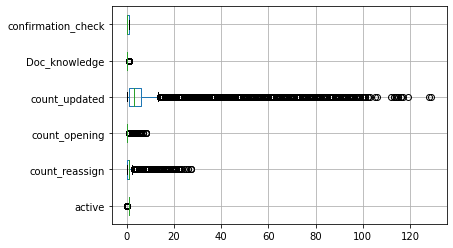

In [55]:
# check for outliers
df.boxplot(vert = False) # certain outliers are present

In [16]:
# label encoding categorical variables
string_new= ['ID','ID_status','ID_caller','active','type_contact','impact','notify', 'opened_time', 'created_at', 'updated_at', 'Doc_knowledge', 'confirmation_check','opened_by', 'Created_by', 'updated_by', 'location', 'category_ID', 'user_symptom',  'Support_group', 'support_incharge']
number= preprocessing.LabelEncoder()
for i in string_new:
   df[i] = number.fit_transform(df[i])

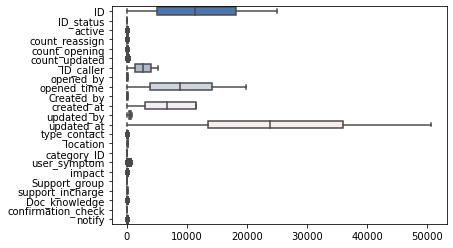

In [58]:
# total dataset visualization in one plane
sns.boxplot(data=df,orient="h", palette="vlag")  # post encoding, outliers are masked

count_updated
Change the outliers with median  3.0
count_reassign
Change the outliers with median  1.0


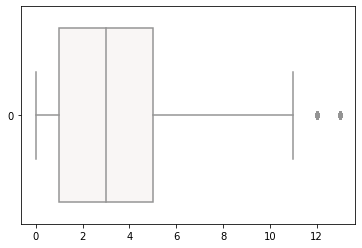

In [17]:
# handle outliers
df3= df.loc[:,["count_updated","count_reassign"]]
df3.describe
for col_name in df3.select_dtypes(include=np.number).columns:
    print(col_name)
    q1 = df3[col_name].quantile(0.25)
    q3 = df3[col_name].quantile(0.75)
    iqr = q3 - q1
    low = q1-1.5*iqr
    high = q3+1.5*iqr 
    print("Change the outliers with median ",df3[col_name].median())
    df3.loc[(df3[col_name] < low) | (df3[col_name] > high)] = df3[col_name].median()

sns.boxplot(data= df3["count_updated"], orient = "h", palette="vlag")

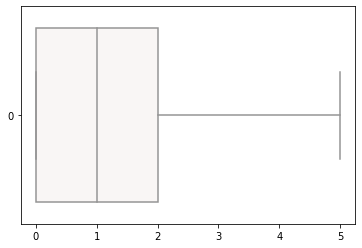

In [18]:
sns.boxplot(data= df3["count_reassign"], orient = "h", palette="vlag")

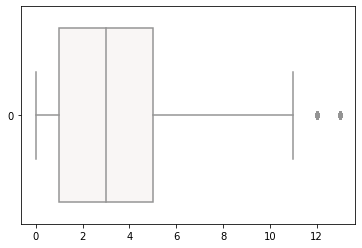

In [19]:
df4= df.drop(["count_updated","count_reassign"], axis= 1)
df4.shape
df_new= pd.concat([df4, df3],axis= 1)
df_new.shape
sns.boxplot(data=df_new["count_updated"],orient="h", palette="vlag")

In [20]:
df_new.corr()   

,ID,ID_status,active,count_opening,ID_caller,opened_by,opened_time,Created_by,created_at,updated_by,...,category_ID,user_symptom,impact,Support_group,support_incharge,Doc_knowledge,confirmation_check,notify,count_updated,count_reassign
ID,1.000000,0.096378,-0.046590,-0.006647,-0.008954,-0.146561,0.999945,-0.215812,0.603107,0.043764,...,0.016649,0.035801,-0.055315,0.030644,-0.013517,-0.623088,0.242189,-0.030545,-0.099234,-0.116442
ID_status,0.096378,1.000000,-0.165452,-0.077673,-0.003875,-0.025942,0.096369,-0.038446,0.088138,0.092681,...,-0.016705,0.014369,-0.004543,0.078681,-0.044177,-0.067473,0.408274,0.017835,-0.090881,-0.146324
active,-0.046590,-0.165452,1.000000,0.019083,0.004318,0.005342,-0.046417,0.040615,-0.046576,-0.482615,...,0.004053,-0.015211,-0.021294,-0.040518,-0.003175,0.043711,-0.488946,-0.009601,-0.170160,0.031754
count_opening,-0.006647,-0.077673,0.019083,1.000000,-0.006726,-0.006782,-0.006502,-0.012330,0.005128,-0.010630,...,0.012547,-0.004071,-0.003977,-0.014818,-0.008156,0.006847,0.131248,-0.003065,0.055943,0.114312
ID_caller,-0.008954,-0.003875,0.004318,-0.006726,1.000000,0.053115,-0.009037,-0.017684,-0.005384,0.007651,...,-0.015916,-0.003151,-0.006123,-0.012773,-0.028421,0.004471,-0.008350,-0.001060,0.001660,0.000082
opened_by,-0.146561,-0.025942,0.005342,-0.006782,0.053115,1.000000,-0.145899,0.227737,-0.098602,0.003265,...,-0.012207,-0.012798,-0.081875,-0.006397,0.048312,0.160563,-0.047642,-0.000843,0.016496,0.008443
opened_time,0.999945,0.096369,-0.046417,-0.006502,-0.009037,-0.145899,1.000000,-0.215133,0.602407,0.043766,...,0.016988,0.035109,-0.054871,0.029895,-0.013537,-0.617276,0.241242,-0.030690,-0.098941,-0.116473
Created_by,-0.215812,-0.038446,0.040615,-0.012330,-0.017684,0.227737,-0.215133,1.000000,-0.346581,-0.157715,...,0.025848,-0.040206,0.024168,-0.259980,0.167417,0.191718,-0.078456,-0.011733,0.066308,0.062244
created_at,0.603107,0.088138,-0.046576,0.005128,-0.005384,-0.098602,0.602407,-0.346581,1.000000,0.079940,...,0.016321,0.044643,-0.034249,0.172706,-0.073380,-0.413206,0.160898,0.005697,-0.087469,-0.105478
updated_by,0.043764,0.092681,-0.482615,-0.010630,0.007651,0.003265,0.043766,-0.157715,0.079940,1.000000,...,-0.002399,0.013493,0.017055,0.048169,-0.122580,-0.038212,0.199193,0.022750,0.017999,-0.087432


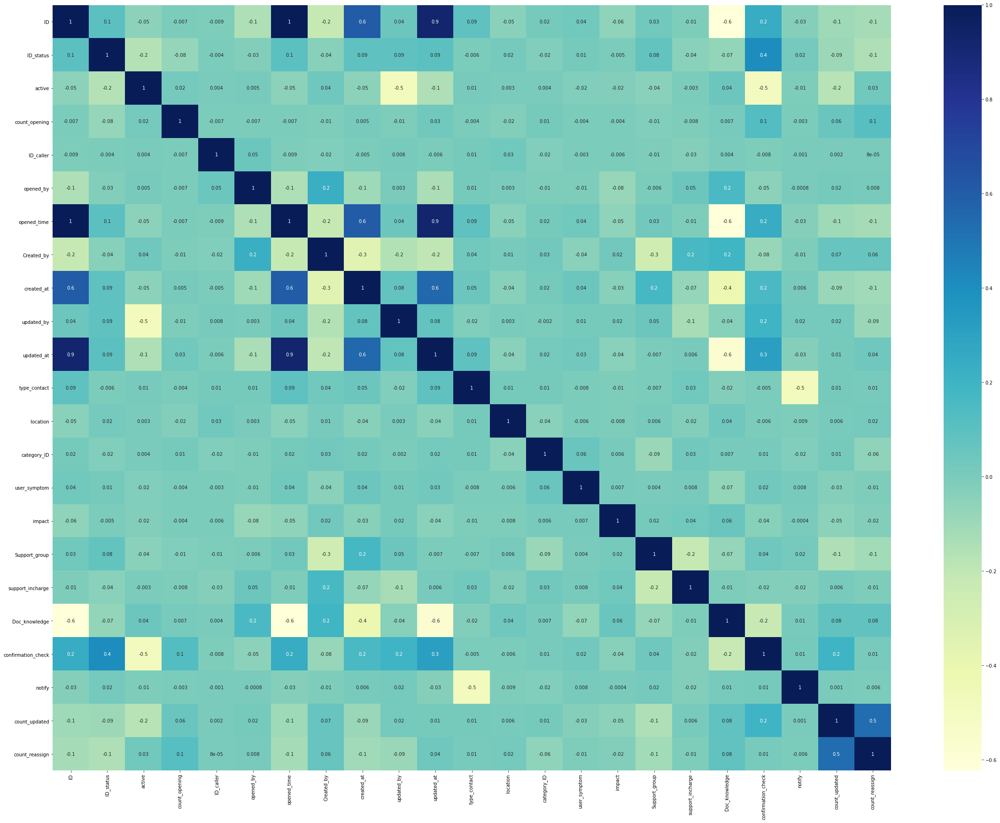

In [24]:
corr= df_new.corr()
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns,cmap="YlGnBu",annot=True, fmt='.1g')
plt.rcParams["figure.figsize"] = (30,30)
# opened_at and updated_time have a corelation with ID and opend_at and updated_at are also related

C:\Users\SUCHARITA\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\SUCHARITA\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\SUCHARITA\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\SUCHARITA\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\SUCHARITA\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\SUCHARITA\anaconda3\lib\site-packages\seaborn\distributions.p

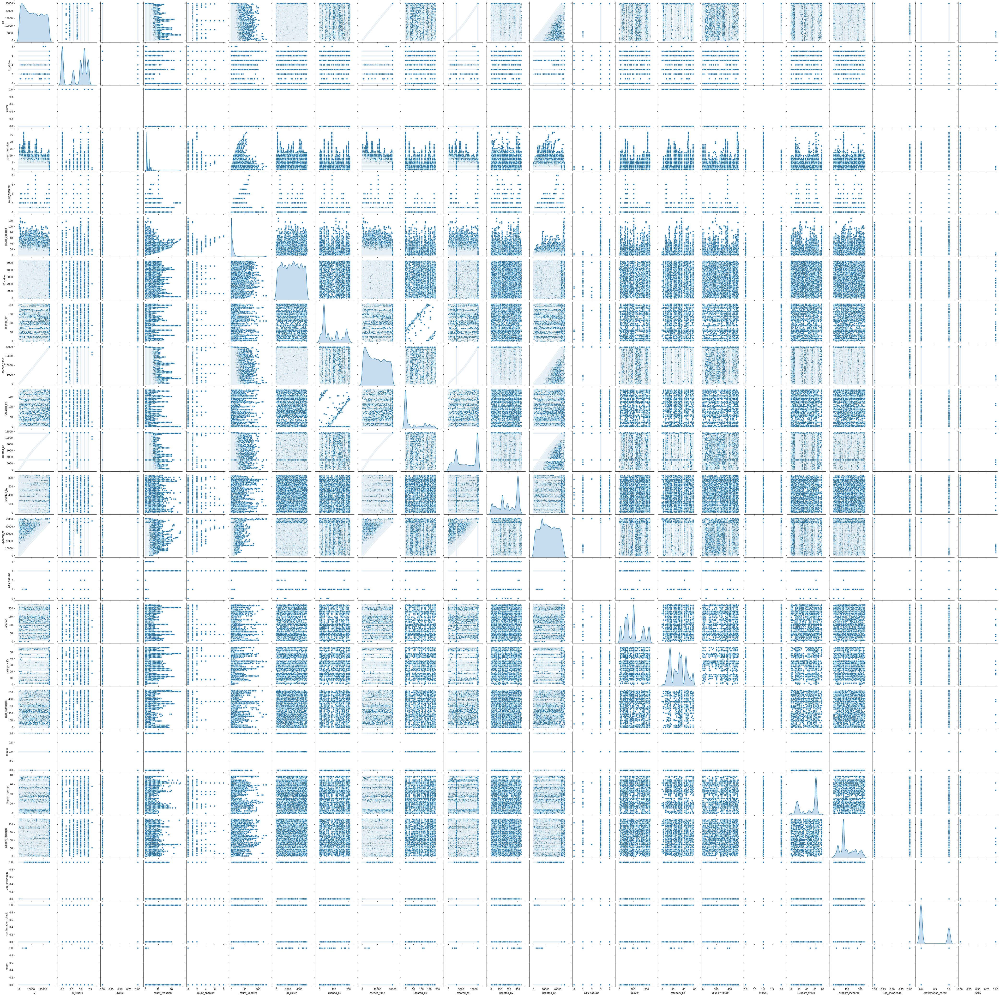

In [68]:
sns.pairplot(df_new, diag_kind='kde')
plt.rcParams["figure.figsize"] = (40,30)
plt.show()

In [25]:
df_new.describe() # mean and range is varying widely for all attributes

,ID,ID_status,active,count_opening,ID_caller,opened_by,opened_time,Created_by,created_at,updated_by,...,category_ID,user_symptom,impact,Support_group,support_incharge,Doc_knowledge,confirmation_check,notify,count_updated,count_reassign
count,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,...,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000
mean,11711.962614,4.031966,0.823685,0.021918,2642.115516,83.924354,9178.492612,45.938700,6739.649860,479.861981,...,30.107366,328.566826,1.002787,44.785495,104.196906,0.178976,0.289122,0.000840,3.319606,0.984878
std,7357.929618,2.707201,0.381090,0.207302,1505.418010,64.705673,5833.076567,60.665433,3926.282482,264.518059,...,14.206292,113.431407,0.228142,21.884362,59.453893,0.383333,0.453356,0.028966,3.084555,1.220601
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5056.000000,0.000000,1.000000,0.000000,1339.000000,31.000000,3840.000000,1.000000,3091.000000,306.000000,...,15.000000,365.000000,1.000000,19.000000,73.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,11317.000000,5.000000,1.000000,0.000000,2661.000000,60.000000,8807.000000,1.000000,6695.000000,468.000000,...,32.000000,365.000000,1.000000,57.000000,74.000000,0.000000,0.000000,0.000000,3.000000,1.000000
75%,18158.000000,6.000000,1.000000,0.000000,3927.000000,139.000000,14245.000000,101.000000,11424.000000,762.000000,...,44.000000,365.000000,1.000000,63.000000,155.000000,0.000000,1.000000,0.000000,5.000000,2.000000
max,24917.000000,8.000000,1.000000,8.000000,5243.000000,206.000000,19848.000000,184.000000,11551.000000,845.000000,...,57.000000,524.000000,2.000000,77.000000,233.000000,1.000000,1.000000,1.000000,13.000000,5.000000


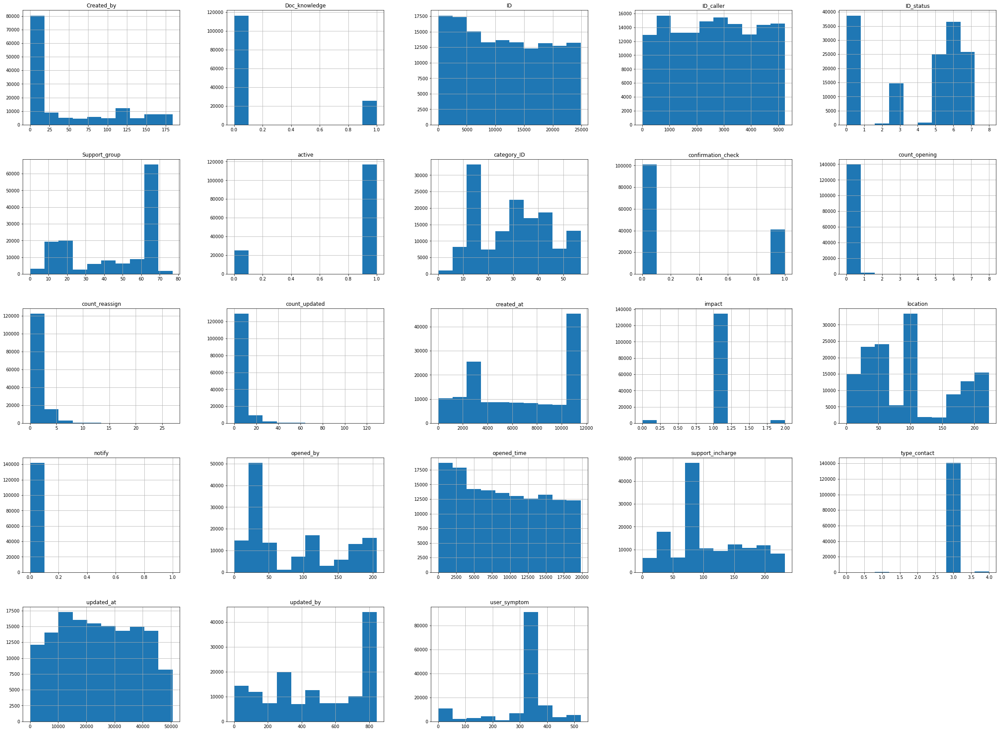

In [70]:
# check attribute normal distribution through histogram plot
df_new.hist()
plt.show()

In [26]:
df_new.skew() # ideal range is +-0.5 
#"active","notify","type_contact","count_updated","count_opening","count_reassign",
#"created_by","user symptom" ,"doc_knowledge","confirmation check" are out of range

ID                     0.131624
ID_status             -0.563710
active                -1.698757
count_opening         15.563604
ID_caller             -0.006404
opened_by              0.548547
opened_time            0.155221
Created_by             0.942971
created_at            -0.072367
updated_by            -0.308319
updated_at             0.057545
type_contact          -5.143954
location               0.470006
category_ID            0.124434
user_symptom          -1.736301
impact                 0.198083
Support_group         -0.530894
support_incharge       0.496516
Doc_knowledge          1.674933
confirmation_check     0.930312
notify                34.465680
count_updated          1.140196
count_reassign         1.152382
dtype: float64

In [27]:
df_new.kurtosis() # ideal range +-3
#"notify","impact","type_contact","count_updated","count_opening","count_reassign" are out of range

ID                      -1.238831
ID_status               -1.314801
active                   0.885787
count_opening          344.307029
ID_caller               -1.181588
opened_by               -1.237975
opened_time             -1.232746
Created_by              -0.700065
created_at              -1.537807
updated_by              -1.323199
updated_at              -1.121396
type_contact           197.986407
location                -0.927401
category_ID             -1.015949
user_symptom             2.344852
impact                  16.205751
Support_group           -1.386291
support_incharge        -0.846604
Doc_knowledge            0.805413
confirmation_check      -1.134535
notify                1185.899867
count_updated            0.722582
count_reassign           0.464073
dtype: float64

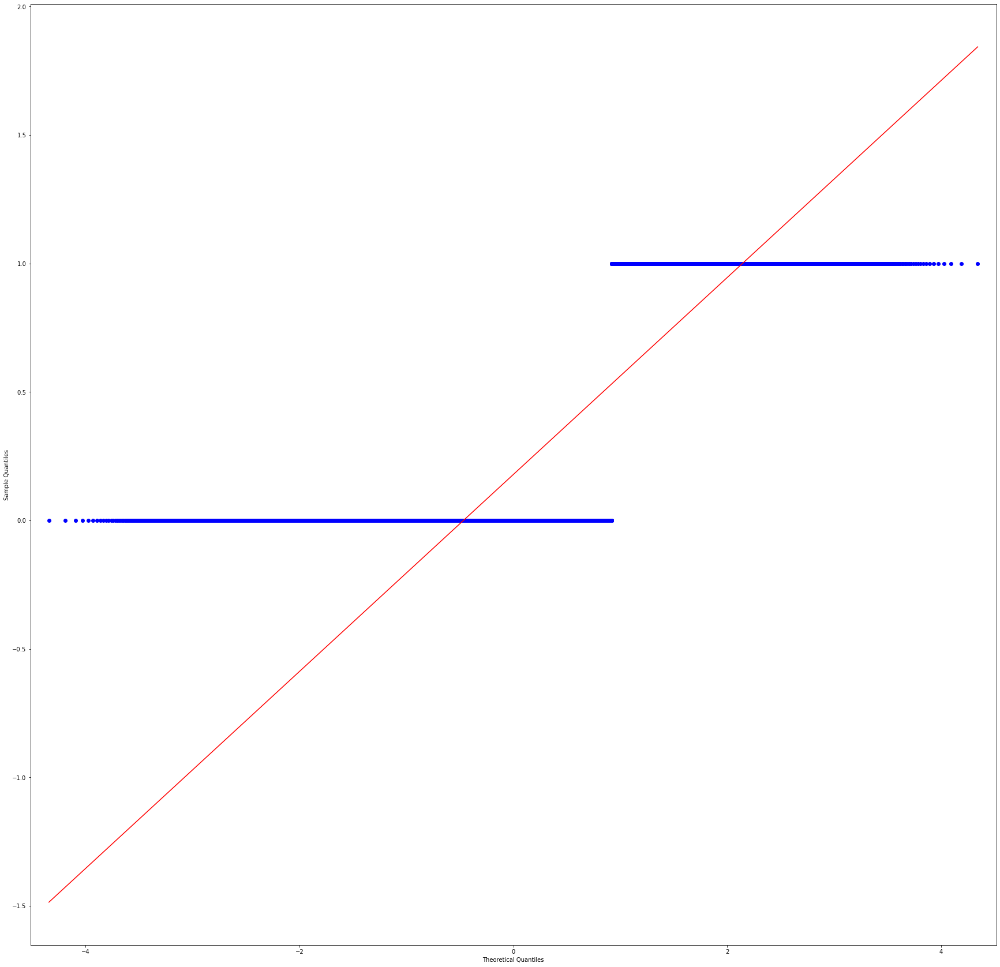

In [28]:
# use qqplot() to visually identify data distribution and normality
qqplot(df_new["Doc_knowledge"], line='s')
plt.show()
# same can be done for each of the attributes, reconfirming that the data is not normal

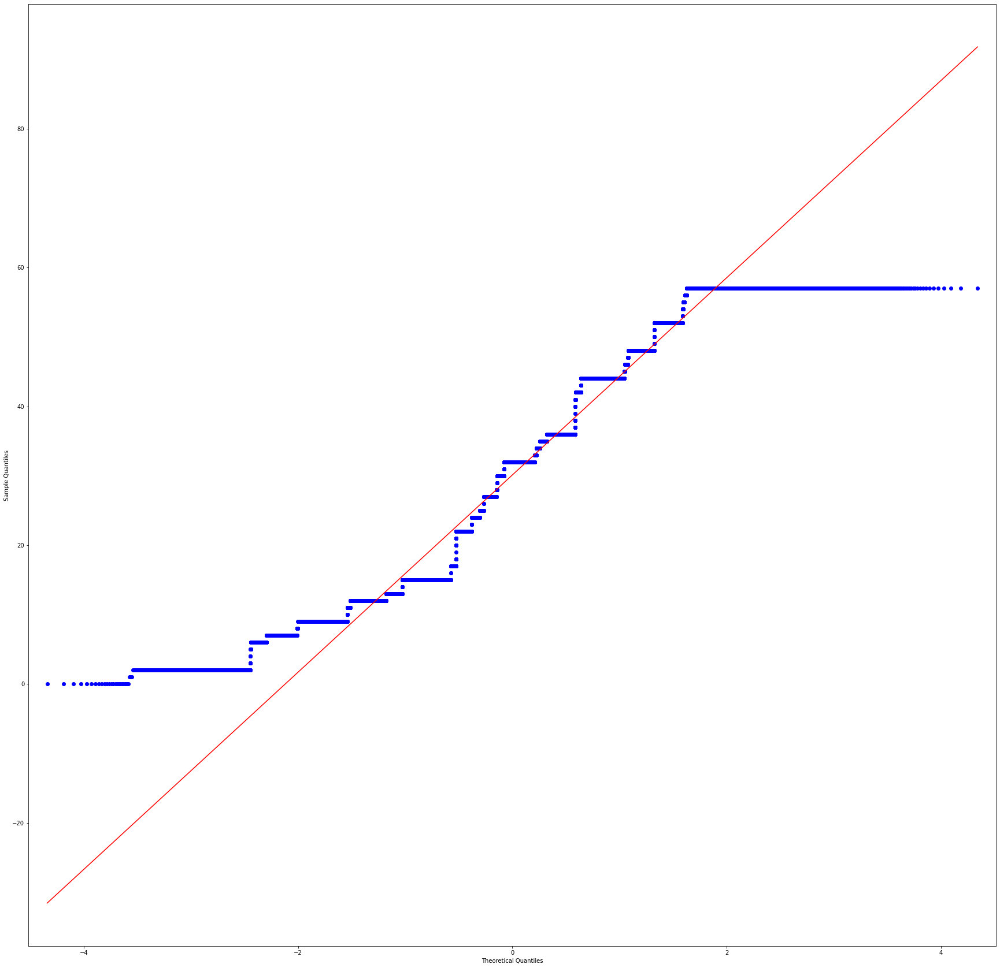

In [29]:
# use qqplot() to visually identify data distribution and normality
qqplot(df_new["category_ID"], line='s')
plt.show()
# same can be done for each of the attributes, reconfirming that the data is not normal

In [31]:
# Feature scaling
x= df_new.drop(["impact"],axis= 1)
x.info()
x.shape



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 141712 entries, 0 to 141711
Data columns (total 22 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   ID                  141712 non-null  int32  
 1   ID_status           141712 non-null  int32  
 2   active              141712 non-null  int64  
 3   count_opening       141712 non-null  int64  
 4   ID_caller           141712 non-null  int32  
 5   opened_by           141712 non-null  int32  
 6   opened_time         141712 non-null  int64  
 7   Created_by          141712 non-null  int32  
 8   created_at          141712 non-null  int64  
 9   updated_by          141712 non-null  int32  
 10  updated_at          141712 non-null  int64  
 11  type_contact        141712 non-null  int32  
 12  location            141712 non-null  int32  
 13  category_ID         141712 non-null  int32  
 14  user_symptom        141712 non-null  int32  
 15  Support_group       141712 non-nul

(141712, 22)

In [32]:
y= df_new["impact"] # series
y= pd.DataFrame(y)
y["impact"].value_counts()

1    134335
2      3886
0      3491
Name: impact, dtype: int64

In [33]:
# Feature scaling
scaler= MinMaxScaler()
d_scale= scaler.fit_transform(x) # an array is getting created

In [34]:
d_scale.shape #(141712, 23)

(141712, 22)

In [35]:
#convert array to dataframe
d_scale= pd.DataFrame(d_scale,columns = x.columns)

In [36]:
#convert array to dataframe
d_scale.head()

,ID,ID_status,active,count_opening,ID_caller,opened_by,opened_time,Created_by,created_at,updated_by,...,location,category_ID,user_symptom,Support_group,support_incharge,Doc_knowledge,confirmation_check,notify,count_updated,count_reassign
0,0.00000,0.750,1.0,0.0,0.278848,0.970874,0.00000,0.820652,0.000000,0.123077,...,0.192825,0.807018,0.956107,0.610390,0.313305,1.0,0.0,0.0,0.000000,0.0
1,0.00000,0.875,1.0,0.0,0.278848,0.970874,0.00000,0.820652,0.000000,0.778698,...,0.192825,0.807018,0.956107,0.610390,0.313305,1.0,0.0,0.0,0.230769,0.0
2,0.00000,0.625,0.0,0.0,0.278848,0.970874,0.00000,0.820652,0.000000,0.901775,...,0.192825,0.807018,0.956107,0.610390,0.313305,1.0,0.0,0.0,0.307692,0.0
3,0.00004,0.000,1.0,0.0,0.278848,0.582524,0.00005,0.315217,0.000087,0.123077,...,0.278027,0.526316,0.671756,0.194805,0.716738,1.0,0.0,0.0,0.076923,0.2
4,0.00004,0.000,1.0,0.0,0.278848,0.582524,0.00005,0.315217,0.000087,0.123077,...,0.278027,0.526316,0.671756,0.194805,0.716738,1.0,0.0,0.0,0.153846,0.2


In [37]:
d_scale.describe()

,ID,ID_status,active,count_opening,ID_caller,opened_by,opened_time,Created_by,created_at,updated_by,...,location,category_ID,user_symptom,Support_group,support_incharge,Doc_knowledge,confirmation_check,notify,count_updated,count_reassign
count,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,...,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000,141712.000000
mean,0.470039,0.503996,0.823685,0.002740,0.503932,0.407400,0.462439,0.249667,0.583469,0.567884,...,0.443606,0.528199,0.627036,0.581630,0.447197,0.178976,0.289122,0.000840,0.255354,0.196976
std,0.295298,0.338400,0.381090,0.025913,0.287129,0.314105,0.293887,0.329703,0.339908,0.313039,...,0.290653,0.249233,0.216472,0.284212,0.255167,0.383333,0.453356,0.028966,0.237273,0.244120
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.202914,0.000000,1.000000,0.000000,0.255388,0.150485,0.193470,0.005435,0.267596,0.362130,...,0.192825,0.263158,0.696565,0.246753,0.313305,0.000000,0.000000,0.000000,0.076923,0.000000
50%,0.454188,0.625000,1.000000,0.000000,0.507534,0.291262,0.443722,0.005435,0.579603,0.553846,...,0.466368,0.561404,0.696565,0.740260,0.317597,0.000000,0.000000,0.000000,0.230769,0.200000
75%,0.728739,0.750000,1.000000,0.000000,0.748999,0.674757,0.717705,0.548913,0.989005,0.901775,...,0.735426,0.771930,0.696565,0.818182,0.665236,0.000000,1.000000,0.000000,0.384615,0.400000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [38]:
d_scale.skew()

ID                     0.131624
ID_status             -0.563710
active                -1.698757
count_opening         15.563604
ID_caller             -0.006404
opened_by              0.548547
opened_time            0.155221
Created_by             0.942971
created_at            -0.072367
updated_by            -0.308319
updated_at             0.057545
type_contact          -5.143954
location               0.470006
category_ID            0.124434
user_symptom          -1.736301
Support_group         -0.530894
support_incharge       0.496516
Doc_knowledge          1.674933
confirmation_check     0.930312
notify                34.465680
count_updated          1.140196
count_reassign         1.152382
dtype: float64

In [39]:
# feature standardization
std=StandardScaler()
d_std= std.fit_transform(x)

In [40]:
d_std.shape

(141712, 22)

In [41]:
#convert array to dataframe
d_std= pd.DataFrame(d_std,columns = x.columns)

In [42]:
d_std.head()

,ID,ID_status,active,count_opening,ID_caller,opened_by,opened_time,Created_by,created_at,updated_by,...,location,category_ID,user_symptom,Support_group,support_incharge,Doc_knowledge,confirmation_check,notify,count_updated,count_reassign
0,-1.591753,0.726965,0.462663,-0.105729,-0.783915,1.793908,-1.573531,1.731821,-1.716553,-1.420936,...,-0.862823,1.118708,1.520159,0.101192,-0.524726,2.14181,-0.637738,-0.02899,-1.076206,-0.806882
1,-1.591753,1.096352,0.462663,-0.105729,-0.783915,1.793908,-1.573531,1.731821,-1.716553,0.673446,...,-0.862823,1.118708,1.520159,0.101192,-0.524726,2.14181,-0.637738,-0.02899,-0.103615,-0.806882
2,-1.591753,0.357579,-2.161401,-0.105729,-0.783915,1.793908,-1.573531,1.731821,-1.716553,1.066615,...,-0.862823,1.118708,1.520159,0.101192,-0.524726,2.14181,-0.637738,-0.02899,0.220582,-0.806882
3,-1.591617,-1.489354,0.462663,-0.105729,-0.783915,0.557536,-1.573359,0.198817,-1.716299,-1.420936,...,-0.569682,-0.007558,0.206585,-1.361045,1.056336,2.14181,-0.637738,-0.02899,-0.752009,0.012389
4,-1.591617,-1.489354,0.462663,-0.105729,-0.783915,0.557536,-1.573359,0.198817,-1.716299,-1.420936,...,-0.569682,-0.007558,0.206585,-1.361045,1.056336,2.14181,-0.637738,-0.02899,-0.427812,0.012389


In [43]:
d_std.describe()

,ID,ID_status,active,count_opening,ID_caller,opened_by,opened_time,Created_by,created_at,updated_by,...,location,category_ID,user_symptom,Support_group,support_incharge,Doc_knowledge,confirmation_check,notify,count_updated,count_reassign
count,1.417120e+05,1.417120e+05,1.417120e+05,1.417120e+05,1.417120e+05,1.417120e+05,1.417120e+05,1.417120e+05,1.417120e+05,1.417120e+05,...,1.417120e+05,1.417120e+05,1.417120e+05,1.417120e+05,1.417120e+05,1.417120e+05,1.417120e+05,1.417120e+05,1.417120e+05,1.417120e+05
mean,-5.265916e-15,-2.300371e-14,-6.218227e-15,-8.829786e-15,-4.426179e-16,-5.327898e-14,1.513454e-15,-6.520092e-14,-5.829022e-14,1.174610e-14,...,-1.303912e-14,-3.148904e-17,6.318545e-15,-8.463105e-15,-3.018913e-15,4.132066e-13,4.632061e-14,-1.967830e-14,-8.122147e-17,-1.241953e-13
std,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,...,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00
min,-1.591753e+00,-1.489354e+00,-2.161401e+00,-1.057285e-01,-1.755077e+00,-1.297022e+00,-1.573531e+00,-7.572494e-01,-1.716553e+00,-1.814106e+00,...,-1.526246e+00,-2.119305e+00,-2.896623e+00,-2.046468e+00,-1.752573e+00,-4.668947e-01,-6.377385e-01,-2.899029e-02,-1.076206e+00,-8.068821e-01
25%,-9.046004e-01,-1.489354e+00,4.626628e-01,-1.057285e-01,-8.656201e-01,-8.179274e-01,-9.152137e-01,-7.407655e-01,-9.292920e-01,-6.572806e-01,...,-8.628226e-01,-1.063432e+00,3.211924e-01,-1.178265e+00,-5.247262e-01,-4.668947e-01,-6.377385e-01,-2.899029e-02,-7.520093e-01,-8.068821e-01
50%,-5.367869e-02,3.575786e-01,4.626628e-01,-1.057285e-01,1.254439e-02,-3.697425e-01,-6.368748e-02,-7.407655e-01,-1.137208e-02,-4.484390e-02,...,7.831319e-02,1.332255e-01,3.211924e-01,5.581405e-01,-5.079064e-01,-4.668947e-01,-6.377385e-01,-2.899029e-02,-1.036153e-01,1.238920e-02
75%,8.760698e-01,7.269651e-01,4.626628e-01,-1.057285e-01,8.535098e-01,8.511748e-01,8.685854e-01,9.076255e-01,1.193079e+00,1.066615e+00,...,1.004020e+00,9.779246e-01,3.211924e-01,8.323098e-01,8.544987e-01,-4.668947e-01,1.568041e+00,-2.899029e-02,5.447787e-01,8.316605e-01
max,1.794674e+00,1.465738e+00,4.626628e-01,3.848539e+01,1.727689e+00,1.886636e+00,1.829145e+00,2.275790e+00,1.225426e+00,1.380395e+00,...,1.914299e+00,1.893015e+00,1.722926e+00,1.472038e+00,2.166444e+00,2.141810e+00,1.568041e+00,3.449431e+01,3.138355e+00,3.289474e+00


In [44]:
d_std.skew()

ID                     0.131624
ID_status             -0.563710
active                -1.698757
count_opening         15.563604
ID_caller             -0.006404
opened_by              0.548547
opened_time            0.155221
Created_by             0.942971
created_at            -0.072367
updated_by            -0.308319
updated_at             0.057545
type_contact          -5.143954
location               0.470006
category_ID            0.124434
user_symptom          -1.736301
Support_group         -0.530894
support_incharge       0.496516
Doc_knowledge          1.674933
confirmation_check     0.930312
notify                34.465680
count_updated          1.140196
count_reassign         1.152382
dtype: float64

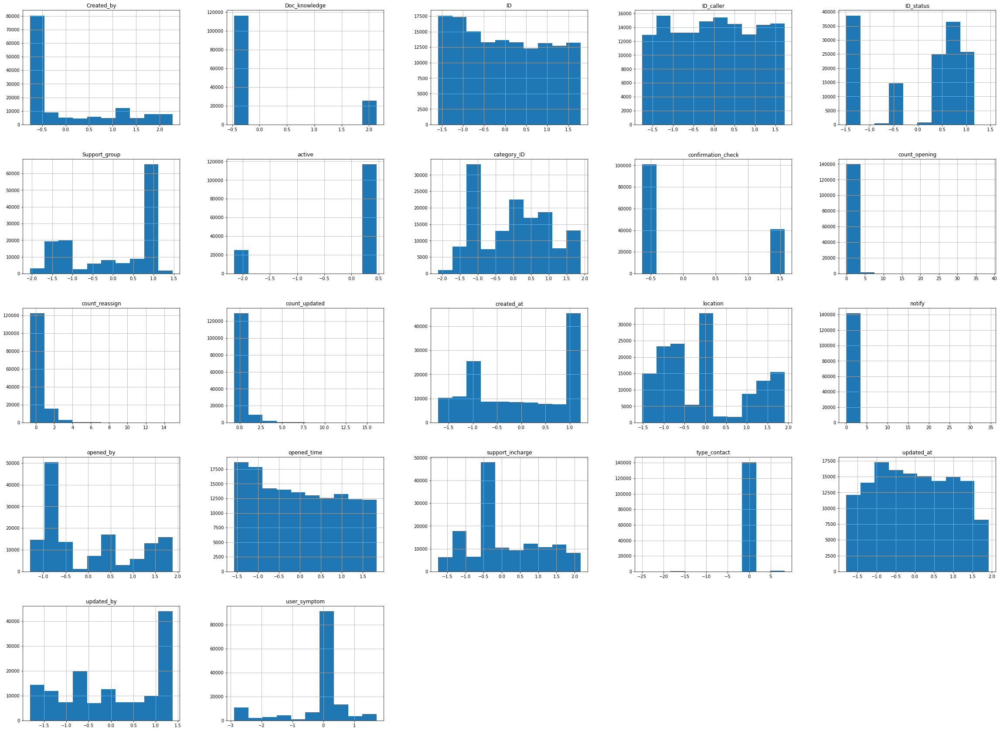

In [121]:
d_std.hist()
plt.show()

In [45]:
d_norm = preprocessing.normalize(x)
#convert array to dataframe
d_norm= pd.DataFrame(d_norm,columns = x.columns)

In [46]:
d_norm.head()

,ID,ID_status,active,count_opening,ID_caller,opened_by,opened_time,Created_by,created_at,updated_by,...,location,category_ID,user_symptom,Support_group,support_incharge,Doc_knowledge,confirmation_check,notify,count_updated,count_reassign
0,0.000000,0.003815,0.000636,0.0,0.929569,0.127164,0.000000,0.096009,0.000000,0.066125,...,0.027340,0.029248,0.318546,0.029884,0.046415,0.000636,0.0,0.0,0.000000,0.000000
1,0.000000,0.004102,0.000586,0.0,0.856683,0.117193,0.000000,0.088481,0.000000,0.385566,...,0.025197,0.026954,0.293569,0.027540,0.042776,0.000586,0.0,0.0,0.001758,0.000000
2,0.000000,0.001473,0.000000,0.0,0.430577,0.058903,0.000000,0.044471,0.000000,0.224419,...,0.012664,0.013548,0.147551,0.013842,0.021499,0.000295,0.0,0.0,0.001178,0.000000
3,0.000656,0.000000,0.000656,0.0,0.959270,0.078736,0.000656,0.038056,0.000656,0.068238,...,0.040680,0.019684,0.230960,0.009842,0.109575,0.000656,0.0,0.0,0.000656,0.000656
4,0.000656,0.000000,0.000656,0.0,0.959268,0.078736,0.000656,0.038056,0.000656,0.068238,...,0.040680,0.019684,0.230959,0.009842,0.109574,0.000656,0.0,0.0,0.001312,0.000656


In [47]:
d_norm.skew() # highly skewed

ID                    -1.837435
ID_status              7.020083
active                 6.036485
count_opening         14.287789
ID_caller              2.610577
opened_by              7.107208
opened_time           -1.774536
Created_by             8.086576
created_at             2.400238
updated_by             6.083214
updated_at            -2.996829
type_contact           6.420413
location               7.244428
category_ID            7.120123
user_symptom           6.599530
Support_group          7.367278
support_incharge       8.723155
Doc_knowledge          5.724404
confirmation_check    23.211088
notify                41.498606
count_updated          6.069588
count_reassign         5.815661
dtype: float64

In [48]:
d_norm.kurtosis() #highly kurtotic

ID                       2.566083
ID_status               86.960075
active                  66.428110
count_opening          256.685649
ID_caller                7.769060
opened_by              124.831326
opened_time              2.358967
Created_by             114.139242
created_at               6.851427
updated_by              61.651778
updated_at              11.453649
type_contact            73.209346
location                87.108462
category_ID             85.347122
user_symptom            79.642609
Support_group          114.648233
support_incharge       160.263116
Doc_knowledge           56.863542
confirmation_check    1458.844079
notify                1978.661822
count_updated           82.860079
count_reassign          79.443434
dtype: float64

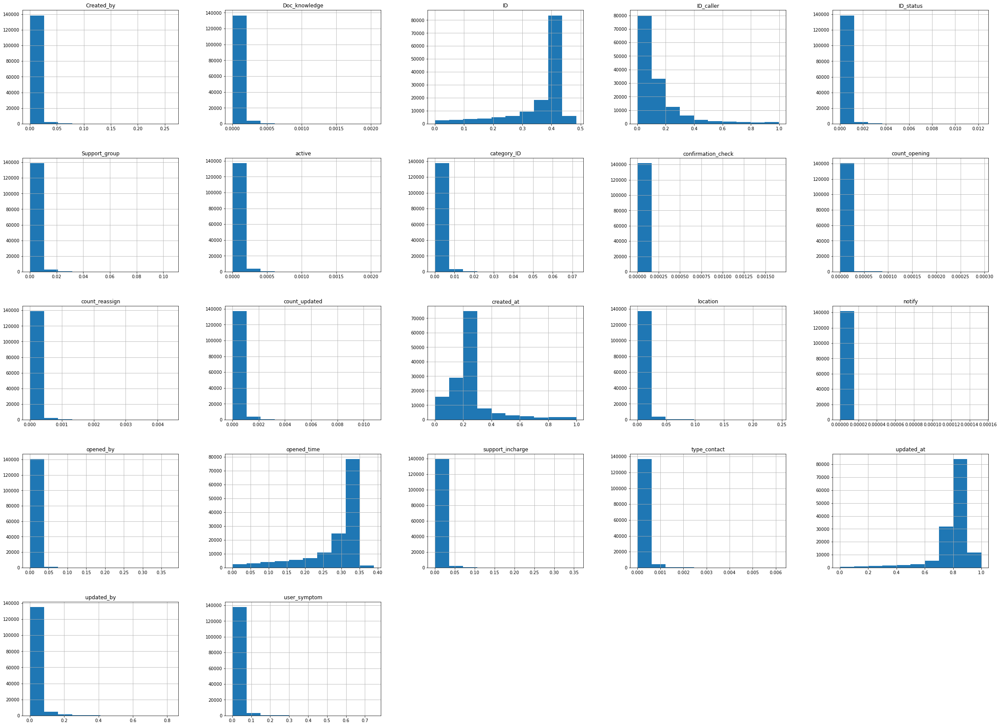

In [130]:
d_norm.hist()
plt.show()

In [49]:
from imblearn.combine import SMOTEENN
from collections import Counter

In [50]:
y = df["impact"]

In [51]:
counter = Counter(y)
print(counter)

Counter({1: 134335, 2: 3886, 0: 3491})


In [52]:
smote_enn = SMOTEENN(random_state=0)
x_resampled, y_resampled = smote_enn.fit_resample(x, y)

In [57]:
x_resampled.shape

(375720, 22)

In [58]:
y_resampled= pd.DataFrame(y_resampled)
y_resampled.shape

(375720, 1)

In [59]:
y_resampled["impact"].value_counts()

0    132515
2    132154
1    111051
Name: impact, dtype: int64

In [61]:
x_resampled["notify"].value_counts()

0    375625
1        95
Name: notify, dtype: int64

In [62]:
# as notify majority class is"0" so we can drop the attribute
x_resampled = x_resampled.drop(['notify'], axis= 1)

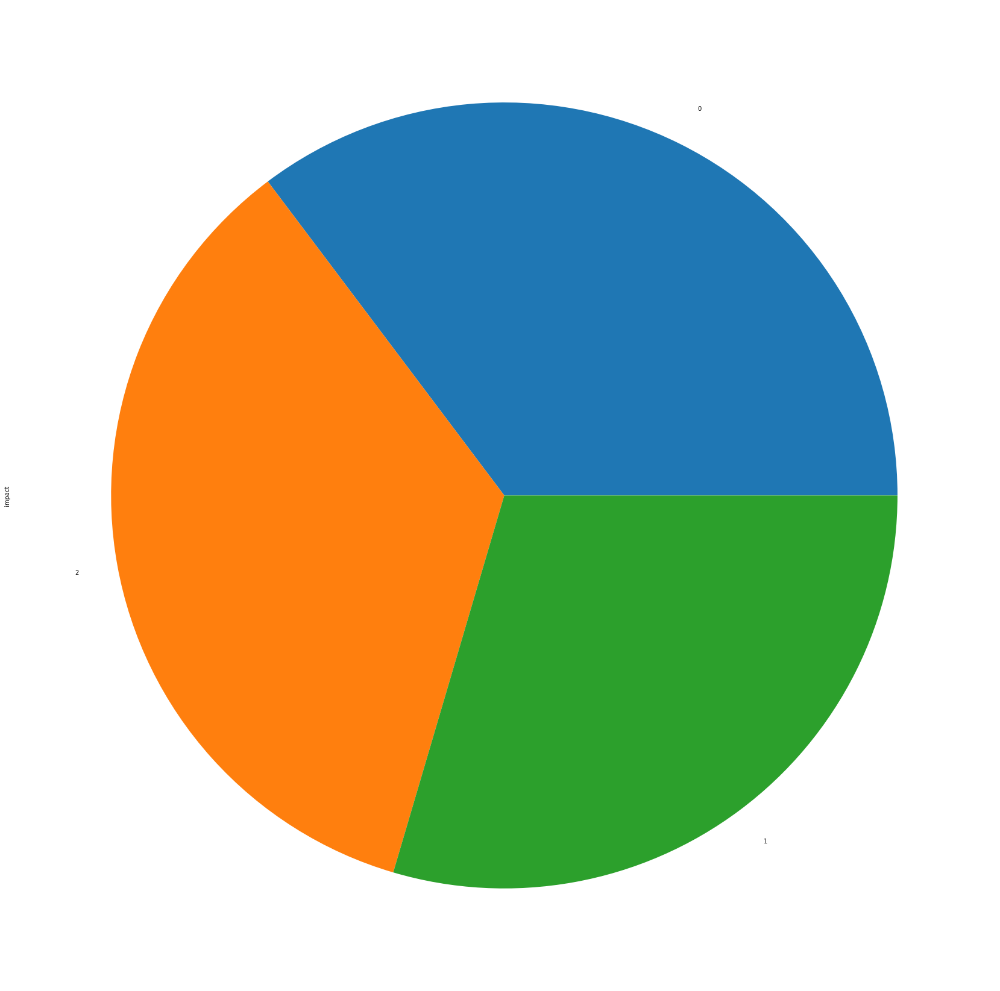

In [63]:
y_resampled["impact"].value_counts().plot(kind="pie") 
plt.show()

In [64]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x_resampled, y_resampled, test_size=.2, random_state=42)
x_col = x_train.columns
print(x_col)

Index(['ID', 'ID_status', 'active', 'count_opening', 'ID_caller', 'opened_by',
       'opened_time', 'Created_by', 'created_at', 'updated_by', 'updated_at',
       'type_contact', 'location', 'category_ID', 'user_symptom',
       'Support_group', 'support_incharge', 'Doc_knowledge',
       'confirmation_check', 'count_updated', 'count_reassign'],
      dtype='object')


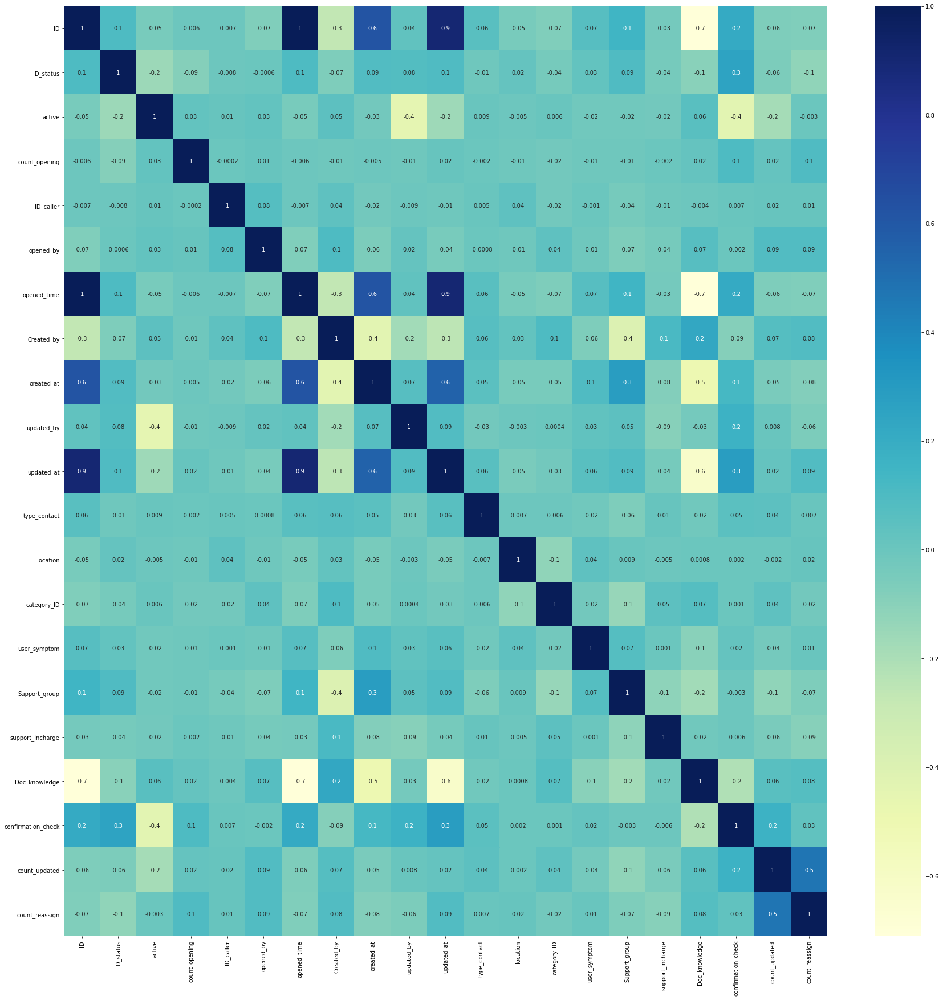

In [65]:
x_train.corr()   
corr= x_train.corr()
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns,cmap="YlGnBu",annot=True, fmt='.1g')

In [66]:
# Selecting best features===================================================================

# use SelectKBest and chi2, preferd when feature names are not imp
from sklearn.feature_selection import SelectKBest, chi2
bestfeatures= SelectKBest(score_func=chi2, k=5,)
fit= bestfeatures.fit(x_train, y_train)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x_train.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(20,'Score'))  #print 20 best features

                 Specs         Score
0                   ID  6.583787e+07
10          updated_at  6.013800e+07
6          opened_time  5.171747e+07
8           created_at  1.304659e+07
5            opened_by  1.406895e+06
7           Created_by  4.439071e+05
9           updated_by  2.292716e+05
16    support_incharge  1.769517e+05
4            ID_caller  1.559924e+05
19       count_updated  3.501508e+04
12            location  1.556279e+04
14        user_symptom  1.553043e+04
15       Support_group  1.310459e+04
17       Doc_knowledge  1.212811e+04
18  confirmation_check  6.267748e+03
20      count_reassign  3.588815e+03
3        count_opening  1.593032e+03
13         category_ID  1.572400e+03
1            ID_status  8.006714e+02
2               active  4.396307e+02


In [67]:
# use Lasso, get the feature names=============================================================
from sklearn.linear_model import LassoCV
clf = LassoCV().fit(x_train, y_train.values.ravel())
importance = np.abs(clf.coef_)
print(importance)
idx_five = importance.argsort()[-5] # we want to set the threshold slightly above the third highest coef_ calculated by LassoCV() from our data.
threshold = importance[idx_five] + 0.01
idx_features = (-importance).argsort()[:15]
name_features = np.array(x_col)[idx_features]
print('Selected features: {}'.format(name_features))


C:\Users\SUCHARITA\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:527: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1473.3274688280653, tolerance: 16.937840892875133
  tol, rng, random, positive)
C:\Users\SUCHARITA\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:527: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 4072.0491310830257, tolerance: 16.937840892875133
  tol, rng, random, positive)
C:\Users\SUCHARITA\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:527: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6891.484049083621, tolerance: 16.937840892875133
  tol, rng, random, positive)
C:\Users\SUCHARITA\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:527: ConvergenceWarning: Objective did n

[7.28535920e-05 0.00000000e+00 0.00000000e+00 0.00000000e+00
 1.83210924e-07 3.86136857e-03 4.26481177e-05 3.75816056e-04
 4.53515153e-07 2.64682121e-04 1.03954948e-05 0.00000000e+00
 2.40669320e-04 0.00000000e+00 2.38154674e-04 1.04476438e-04
 1.29183195e-03 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00]
Selected features: ['opened_by' 'support_incharge' 'Created_by' 'updated_by' 'location'
 'user_symptom' 'Support_group' 'ID' 'opened_time' 'updated_at'
 'created_at' 'ID_caller' 'count_updated' 'type_contact' 'category_ID']


C:\Users\SUCHARITA\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:531: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27875.11672243259, tolerance: 21.174044346519725
  positive)


[0.06829693 0.04278921 0.01355806 0.00310322 0.05520458 0.14210812
 0.06878204 0.06838421 0.05317665 0.03716975 0.0496404  0.00242935
 0.05056355 0.06066782 0.03669973 0.0560271  0.05850279 0.0185487
 0.02175835 0.04734294 0.04524647]


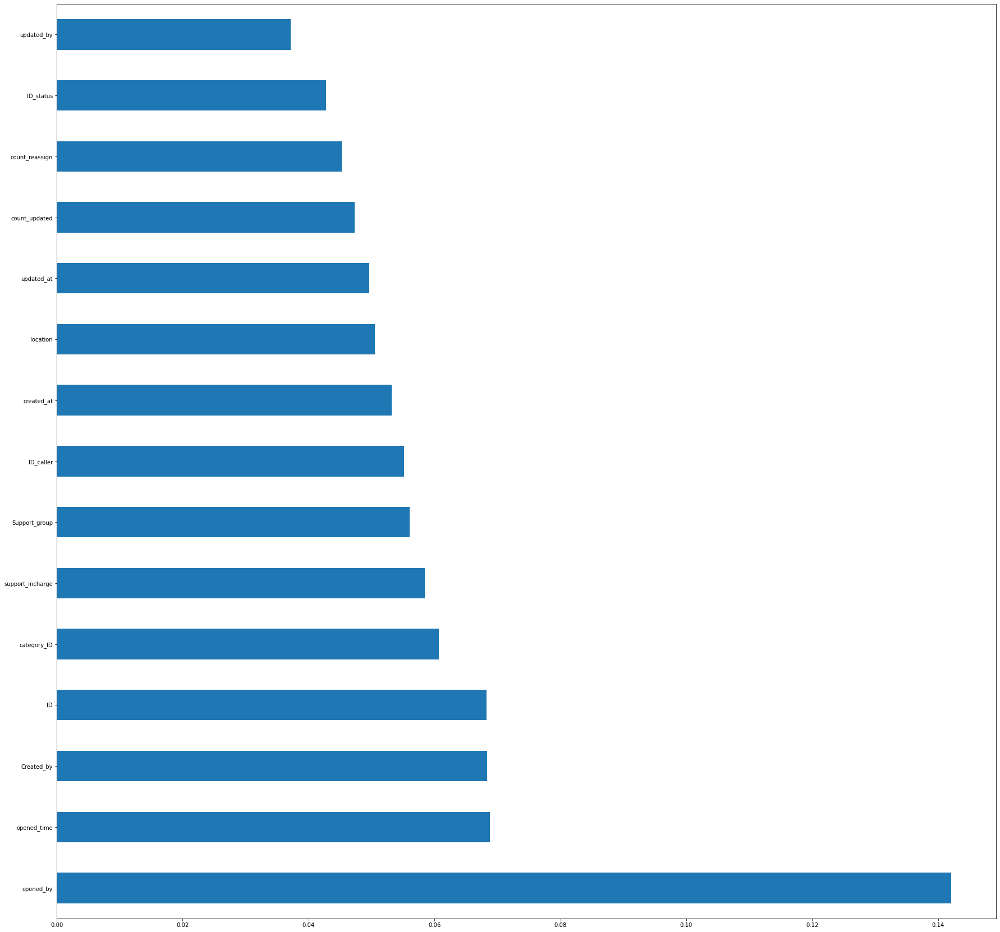

In [68]:
# decisison tree classifier feature importance=====================================================
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(x_train, y_train.values.ravel())
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=x_train.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.show()

Feature: 0, Score: 0.05767
Feature: 1, Score: 0.01007
Feature: 2, Score: 0.00357
Feature: 3, Score: 0.00047
Feature: 4, Score: 0.04797
Feature: 5, Score: 0.33648
Feature: 6, Score: 0.06663
Feature: 7, Score: 0.04820
Feature: 8, Score: 0.02582
Feature: 9, Score: 0.02258
Feature: 10, Score: 0.03762
Feature: 11, Score: 0.00208
Feature: 12, Score: 0.03646
Feature: 13, Score: 0.04422
Feature: 14, Score: 0.02497
Feature: 15, Score: 0.03635
Feature: 16, Score: 0.09999
Feature: 17, Score: 0.00055
Feature: 18, Score: 0.00620
Feature: 19, Score: 0.06405
Feature: 20, Score: 0.02805


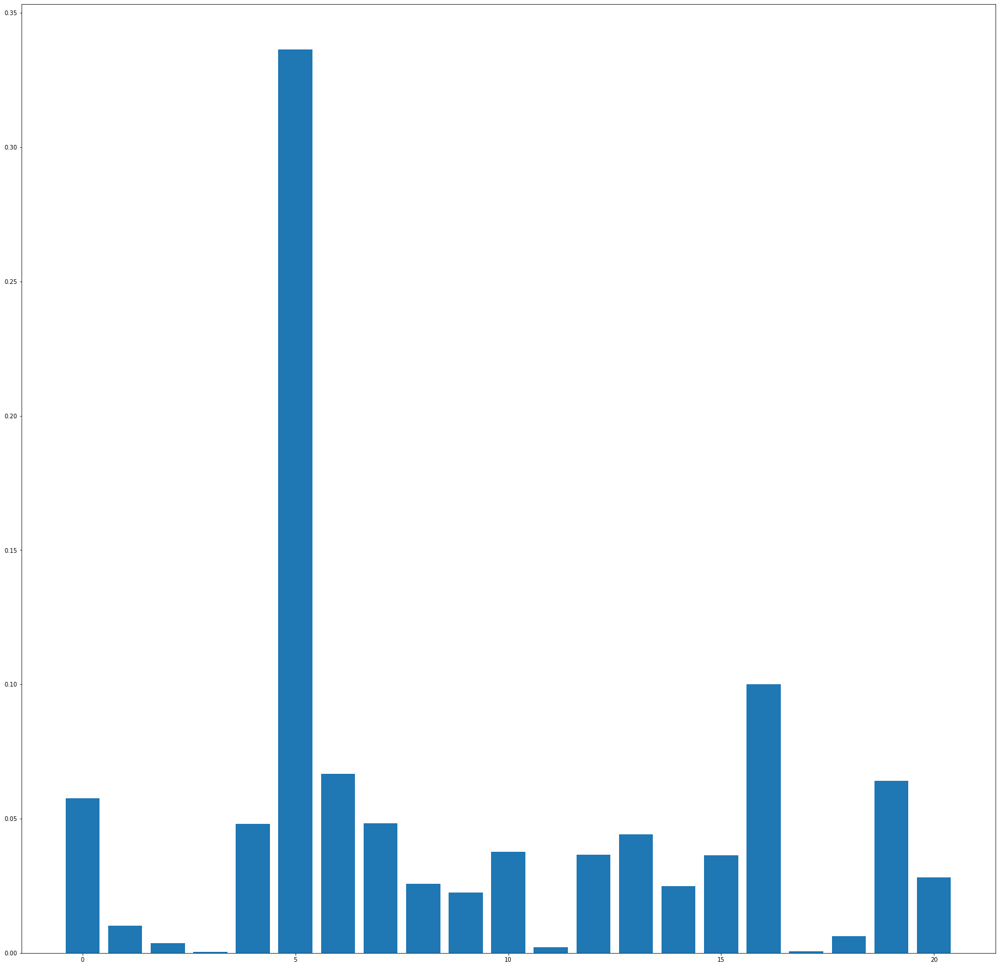

In [69]:
# Random forest feature selection===============================================================
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(x_train, y_train.values.ravel())
importance = rf.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

In [ ]:
# XGBoost feature selection====================================================================
from xgboost import XGBClassifier
xgb = XGBClassifier()
xgb.fit(x_train, y_train.values.ravel())
importance = xgb.feature_importances_
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance, same as RF
plt.bar([x for x in range(len(importance))], importance)
plt.show()
from xgboost import plot_importance
plot_importance(xgb)

In [70]:
predictor = x_train.loc[:,['category_ID','ID' ,'opened_by', 'opened_time','Created_by', 'updated_by' ,'updated_at',
 'Support_group', 'support_incharge', 'location' , 'count_updated','created_at',
 'user_symptom','ID_caller']]

pred_test= x_test.loc[:,['category_ID','ID' ,'opened_by', 'opened_time','Created_by', 'updated_by' ,'updated_at',
 'Support_group', 'support_incharge', 'location' , 'count_updated','created_at',
 'user_symptom','ID_caller']]


In [75]:
# Building Random Forest model---------------------------------------
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_jobs=5,oob_score=True,n_estimators=100,criterion="entropy")
rf.fit(predictor, y_train.values.ravel()) # Fitting RandomForestClassifier model from sklearn.ensemble 
rf.estimators_ 
rf.classes_ # array[0,1,2]
rf.n_classes_ # 3 levels
rf.n_features_  # Number of input features in model is 18
rf.n_outputs_ # Number of outputs when fit performed is 1
rf.oob_score_  # 99.6%  

0.9962804748216757

In [73]:
# Building Random Forest model---------------------------------------
rf.predict(predictor)
len(rf.predict(predictor))
type(rf.predict(predictor))

pred =rf.predict(predictor)
y_pred = pd.DataFrame(pred) # convert to dataframe so that it can be added in 
type(y_pred)
confusion_matrix(y_train,y_pred) # Confusion matrix

print(classification_report(y_train, y_pred)) # accuracy 100%
y_test_pred = rf.predict(pred_test)
confusion_matrix(y_test,y_test_pred)
print(classification_report(y_test,y_test_pred)) # accuracy 92%


              precision    recall  f1-score   support

           0       1.00      1.00      1.00    106075
           1       1.00      1.00      1.00     88835
           2       1.00      1.00      1.00    105666

    accuracy                           1.00    300576
   macro avg       1.00      1.00      1.00    300576
weighted avg       1.00      1.00      1.00    300576

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     26440
           1       0.99      0.99      0.99     22216
           2       1.00      1.00      1.00     26488

    accuracy                           1.00     75144
   macro avg       1.00      1.00      1.00     75144
weighted avg       1.00      1.00      1.00     75144



In [76]:
#Building KNN model -----------------------------------------------
from sklearn.neighbors import KNeighborsClassifier as KNC
knn = KNC(n_neighbors=3)
knn.fit(predictor,y_train.values.ravel())
y_train_pred = knn.predict(predictor)
knn.score(predictor,y_train) # 81.86%

# check prediction accuracy of train data and classification error
print(confusion_matrix(y_train, y_train_pred))
print(classification_report(y_train, y_train_pred)) # accuracy = 82%

# fit test data
knn.score(pred_test,y_test) # 76.75%
y_test_pred = knn.predict(pred_test)
print(confusion_matrix(y_test, y_test_pred)) 
print(classification_report(y_test, y_test_pred))  # accuracy = 77%

[[106058     10      7]
 [   288  88206    341]
 [    13     12 105641]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    106075
           1       1.00      0.99      1.00     88835
           2       1.00      1.00      1.00    105666

    accuracy                           1.00    300576
   macro avg       1.00      1.00      1.00    300576
weighted avg       1.00      1.00      1.00    300576

[[26422    11     7]
 [  319 21594   303]
 [    9    13 26466]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     26440
           1       1.00      0.97      0.99     22216
           2       0.99      1.00      0.99     26488

    accuracy                           0.99     75144
   macro avg       0.99      0.99      0.99     75144
weighted avg       0.99      0.99      0.99     75144



In [74]:

# for 3 neighbors
knn = KNC(n_neighbors= 3)
knn.fit(predictor, y_train.values.ravel())
y_train_pred= knn.predict(predictor)
knn.score(predictor, y_train) # 89.4%
print(confusion_matrix(y_train, y_train_pred))
print(classification_report(y_train, y_train_pred)) # accuracy = 89%

# fit test data
y_test_pred = knn.predict(pred_test)
print(confusion_matrix(y_test, y_test_pred)) 
print(classification_report(y_test, y_test_pred))  # accuracy = 79%


# getting optimal "k" value
a= []
for i in range (2,50,3):
    knn = KNC(n_neighbors=i)
    knn.fit(predictor, y_train.values.ravel())
    train_acc = knn.score(predictor, y_train)
    test_acc = knn.score(pred_test, y_test)
    a.append([train_acc,test_acc])

plt.plot(np.arange(2,50,3),[i[0] for i in a],"bo-")
plt.plot(np.arange(2,50,3), [i[1] for i in a], "rs-")
plt.legend(["train","test"])

[[105923     80     72]
 [  2299  83959   2577]
 [    72    109 105485]]
              precision    recall  f1-score   support

           0       0.98      1.00      0.99    106075
           1       1.00      0.95      0.97     88835
           2       0.98      1.00      0.99    105666

    accuracy                           0.98    300576
   macro avg       0.98      0.98      0.98    300576
weighted avg       0.98      0.98      0.98    300576

[[26367    42    31]
 [ 1077 20078  1061]
 [   27    49 26412]]
              precision    recall  f1-score   support

           0       0.96      1.00      0.98     26440
           1       1.00      0.90      0.95     22216
           2       0.96      1.00      0.98     26488

    accuracy                           0.97     75144
   macro avg       0.97      0.97      0.97     75144
weighted avg       0.97      0.97      0.97     75144

[[106058     10      7]
 [   288  88206    341]
 [    13     12 105641]]
              precision    r

KeyboardInterrupt: 

In [ ]:
# Building model with XGBoost---------------------------------

xgb1 = XGBClassifier(n_estimators=2000,learning_rate=0.3)
xgb1.fit(predictor,y_train.values.ravel())
train_pred_xgb = xgb1.predict(predictor)
print(confusion_matrix(y_train, train_pred_xgb))
print(classification_report(y_train, train_pred_xgb)) # 100%
y_train= pd.DataFrame(y_train)



In [ ]:
test_pred_xgb = xgb1.predict(pred_test)
print(confusion_matrix(y_test, test_pred_xgb ))
print(classification_report(y_test, test_pred_xgb )) # 95%
# Variable importance plot 
from xgboost import plot_importance
plot_importance(xgb1)
